In [3]:
import sys
print(sys.executable)
!{sys.executable} -m pip install torch torchvision --index-url https://download.pytorch.org/whl/cpu

/Users/williamdalonzo/Desktop/miniconda3/envs/practice_env/bin/python
Looking in indexes: https://download.pytorch.org/whl/cpu
  Using cached https://download.pytorch.org/whl/filelock-3.19.1-py3-none-any.whl.metadata (2.1 kB)
  Using cached https://download.pytorch.org/whl/sympy-1.14.0-py3-none-any.whl.metadata (12 kB)
  Using cached https://download.pytorch.org/whl/networkx-3.5-py3-none-any.whl.metadata (6.3 kB)
  Using cached https://download.pytorch.org/whl/fsspec-2025.9.0-py3-none-any.whl.metadata (10 kB)
INFO: pip is looking at multiple versions of networkx to determine which version is compatible with other requirements. This could take a while.
  Using cached https://download.pytorch.org/whl/mpmath-1.3.0-py3-none-any.whl (536 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.4/74.4 MB 40.7 MB/s  0:00:01 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 13.0 MB/s  0:00:00
Using cached https://download.pytorch.org/whl/fsspec-2025.9.0-py3-none-any.whl (199 kB)
   

In [1]:
import os
from pathlib import Path

import numpy as np
import pandas as pd
from PIL import Image
import requests
from io import BytesIO

import torch
import torchvision.transforms as T
from torchvision import models

In [2]:
# Tiny dummy dataset for testing the flow
import pandas as pd

data = pd.DataFrame({
    "listing_id": [1, 2],
    "picture_url": [
        "https://images.pexels.com/photos/271639/pexels-photo-271639.jpeg",
        "https://images.pexels.com/photos/164595/pexels-photo-164595.jpeg",
    ],
})

data

,listing_id,picture_url
0,1,https://images.pexels.com/photos/271639/pexels...
1,2,https://images.pexels.com/photos/164595/pexels...


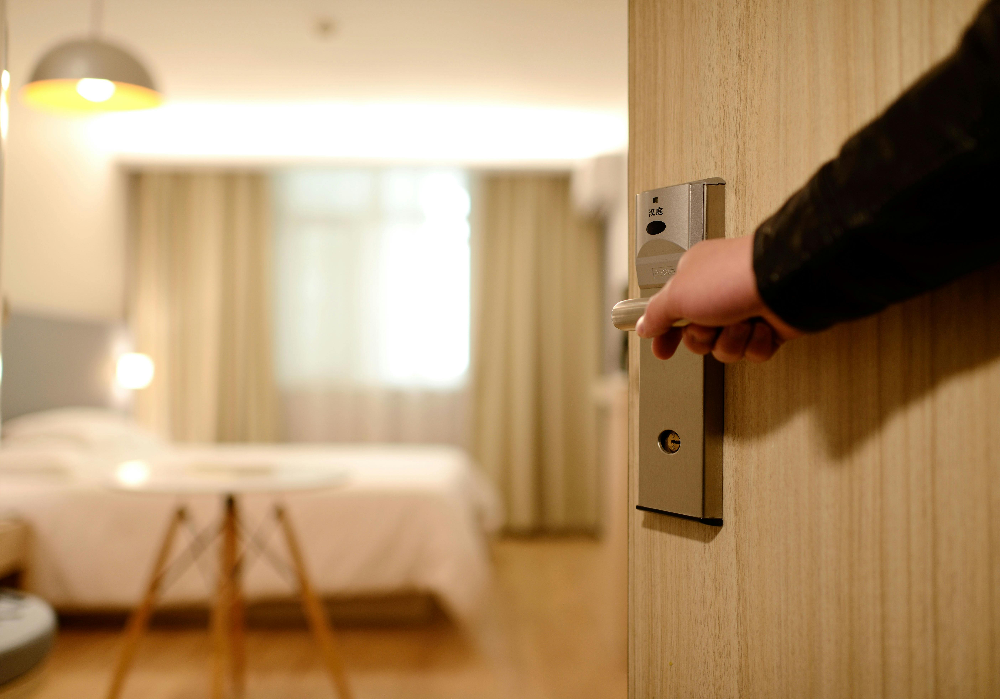

In [3]:
from PIL import Image
import requests
from io import BytesIO

def load_image_from_url(url):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content)).convert("RGB")
    return img

img = load_image_from_url(data.loc[0, "picture_url"])
img

In [4]:
import torch
import torchvision.transforms as T
from torchvision import models

# Pretrained ResNet model (weights automatically downloaded)
resnet = models.resnet18(weights=models.ResNet18_Weights.DEFAULT)
resnet.eval()  # inference mode

# Remove the final classification layer so we get a 512-dim embedding
feature_extractor = torch.nn.Sequential(*list(resnet.children())[:-1])

# Image preprocessing
transform = T.Compose([
    T.Resize(256),
    T.CenterCrop(224),
    T.ToTensor(),
    T.Normalize(mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]),
])

7.3%

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /Users/williamdalonzo/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100.0%


In [5]:
def image_to_vector(img):
    x = transform(img).unsqueeze(0)  # add batch dimension
    with torch.no_grad():
        vec = feature_extractor(x).squeeze().numpy()
    return vec

vec = image_to_vector(img)
vec.shape

(512,)

In [6]:
features = []

for _, row in data.iterrows():
    img = load_image_from_url(row["picture_url"])
    vec = image_to_vector(img)
    features.append(vec)

features = np.vstack(features)
features.shape

(2, 512)

In [7]:
from pathlib import Path
import numpy as np
import pandas as pd

DATA_PATH = Path("..") / "data" / "raw"
csv_path = DATA_PATH / "listings.csv"

df = pd.read_csv(csv_path, low_memory=False)
df.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,3176,https://www.airbnb.com/rooms/3176,20250923202926,2025-09-24,city scrape,Fabulous Flat in great Location,This beautiful first floor apartment is situa...,The neighbourhood is famous for its variety of...,https://a0.muscache.com/pictures/hosting/Hosti...,3718,...,4.70,4.92,4.61,First name and Last name: Nicolas Krotz <br/> ...,f,1,1,0,0,0.76
1,9991,https://www.airbnb.com/rooms/9991,20250923202926,2025-09-24,city scrape,Geourgeous flat - outstanding views,4 bedroom with very large windows and outstand...,Prenzlauer Berg is an amazing neighbourhood wh...,https://a0.muscache.com/pictures/42799131/59c8...,33852,...,5.00,4.86,4.86,03/Z/RA/003410-18,f,1,1,0,0,0.06
2,14325,https://www.airbnb.com/rooms/14325,20250923202926,2025-09-24,city scrape,Studio Apartment in Prenzlauer Berg,The apartment is located on the upper second f...,NaN,https://a0.muscache.com/pictures/508703/24988a...,55531,...,4.85,4.60,4.45,NaN,f,4,4,0,0,0.14
3,17904,https://www.airbnb.com/rooms/17904,20250923202926,2025-09-24,city scrape,Beautiful Kreuzberg studio - 3 months minimum,"- apt is available starting October 1, 2025 (m...","The apartment is located in Kreuzberg, which i...",https://a0.muscache.com/pictures/d9a6f8be-54b9...,68997,...,4.92,4.88,4.65,NaN,f,1,1,0,0,1.57
4,20858,https://www.airbnb.com/rooms/20858,20250923202926,2025-09-24,city scrape,Designer Loft in Berlin Mitte,Bright and sunny condo with two balconies in a...,Fantastic vibe in the middle of the popular Ka...,https://a0.muscache.com/pictures/108232/205b19...,71331,...,4.54,4.91,4.39,03/Z/RA/009767-24,f,1,1,0,0,0.89


In [8]:
cols = [
    "id",
    "picture_url",
    "price",
    "review_scores_rating",
    "number_of_reviews",
]
df_small = df[cols].copy()
df_small.head()

,id,picture_url,price,review_scores_rating,number_of_reviews
0,3176,https://a0.muscache.com/pictures/hosting/Hosti...,$105.00,4.63,150
1,9991,https://a0.muscache.com/pictures/42799131/59c8...,$135.00,5.00,7
2,14325,https://a0.muscache.com/pictures/508703/24988a...,$75.00,4.68,26
3,17904,https://a0.muscache.com/pictures/d9a6f8be-54b9...,$32.00,4.77,298
4,20858,https://a0.muscache.com/pictures/108232/205b19...,$202.00,4.48,140


In [10]:
def clean_price(x):
    if pd.isna(x):
        return np.nan
    x = str(x)
    x = x.replace("$", "").replace(",", "")
    try:
        return float(x)
    except ValueError:
        return np.nan

df_small["price_num"] = df_small["price"].apply(clean_price)

In [11]:
df_use = df_small.dropna(subset=["picture_url", "price_num", "review_scores_rating"])
len(df_use)

7194

In [12]:
sample = df_use.sample(400, random_state=42).reset_index(drop=True)
sample.head()

,id,picture_url,price,review_scores_rating,number_of_reviews,price_num
0,767249323281836677,https://a0.muscache.com/pictures/miso/Hosting-...,$225.00,3.00,2,225.0
1,685239658747636780,https://a0.muscache.com/pictures/prohost-api/H...,$106.00,4.00,1,106.0
2,1057166639635406656,https://a0.muscache.com/pictures/miso/Hosting-...,$159.00,4.60,20,159.0
3,860166688855670260,https://a0.muscache.com/pictures/miso/Hosting-...,$86.00,4.17,12,86.0
4,24010707,https://a0.muscache.com/pictures/miso/Hosting-...,$73.00,4.96,133,73.0


In [14]:
features = []
valid_indices = []

for i, row in sample.iterrows():
    url = row["picture_url"]
    try:
        img = load_image_from_url(url)
        vec = image_to_vector(img)
        features.append(vec)
        valid_indices.append(i)
        
        if (len(valid_indices)) % 20 == 0:
            print(f"Processed {len(valid_indices)} images...")
            
    except Exception as e:
        print(f"Skipping index {i}: {e}")
        continue

features = np.vstack(features)
features.shape

Processed 20 images...
Processed 40 images...
Processed 60 images...
Processed 80 images...
Processed 100 images...
Processed 120 images...
Processed 140 images...
Processed 160 images...
Processed 180 images...
Processed 200 images...
Processed 220 images...
Skipping index 233: cannot identify image file <_io.BytesIO object at 0x136ad2930>
Processed 240 images...
Processed 260 images...
Processed 280 images...
Processed 300 images...
Processed 320 images...
Processed 340 images...
Processed 360 images...
Processed 380 images...


(399, 512)

In [15]:
# Turn features array into a DataFrame
feat_cols = [f"img_f_{j}" for j in range(features.shape[1])]
features_df = pd.DataFrame(features, columns=feat_cols)

# Keep only the rows whose images we successfully processed
sample_valid = sample.loc[valid_indices].reset_index(drop=True)

model_df = pd.concat([sample_valid, features_df], axis=1)
model_df.head()

,id,picture_url,price,review_scores_rating,number_of_reviews,price_num,img_f_0,img_f_1,img_f_2,img_f_3,...,img_f_502,img_f_503,img_f_504,img_f_505,img_f_506,img_f_507,img_f_508,img_f_509,img_f_510,img_f_511
0,767249323281836677,https://a0.muscache.com/pictures/miso/Hosting-...,$225.00,3.00,2,225.0,0.606209,0.875217,0.920631,1.453876,...,0.319641,2.030703,1.157150,0.192058,0.480516,1.325693,2.751543,0.776197,0.965938,0.815015
1,685239658747636780,https://a0.muscache.com/pictures/prohost-api/H...,$106.00,4.00,1,106.0,0.683780,0.749303,1.833644,0.352369,...,0.000000,0.237488,0.141499,0.848902,0.289007,0.882155,1.501183,2.441486,0.115014,0.713621
2,1057166639635406656,https://a0.muscache.com/pictures/miso/Hosting-...,$159.00,4.60,20,159.0,0.901126,0.521163,0.844046,0.336386,...,0.129600,0.812399,0.629191,1.153239,0.079996,1.068487,2.860258,0.377170,0.777885,0.058713
3,860166688855670260,https://a0.muscache.com/pictures/miso/Hosting-...,$86.00,4.17,12,86.0,0.316156,0.337036,0.979019,0.197624,...,0.297330,0.857410,0.272634,2.049119,2.308172,0.103306,3.746016,0.417503,0.101715,0.094445
4,24010707,https://a0.muscache.com/pictures/miso/Hosting-...,$73.00,4.96,133,73.0,0.455444,1.027368,0.584410,1.054289,...,0.501225,0.345270,0.775302,0.851937,1.392996,1.341939,1.902631,0.626736,0.043227,0.231100


In [16]:
PROCESSED_PATH = Path("..") / "data" / "processed"
PROCESSED_PATH.mkdir(exist_ok=True)

out_path = PROCESSED_PATH / "airbnb_image_features_399.csv"
model_df.to_csv(out_path, index=False)
out_path

PosixPath('../data/processed/airbnb_image_features_399.csv')

In [17]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, r2_score
import numpy as np

# Target: log(price)
y = np.log1p(model_df["price_num"].values)

# Features: ONLY image vectors (for now)
X = model_df[feat_cols].values

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)
X_train.shape, X_test.shape

((319, 512), (80, 512))

In [18]:
rf = RandomForestRegressor(
    n_estimators=200,
    max_depth=10,
    random_state=42,
    n_jobs=-1,
)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

mae = mean_absolute_error(np.expm1(y_test), np.expm1(y_pred))
r2 = r2_score(y_test, y_pred)

mae, r2

(76.80925216946328, 0.025419083057757197)

In [19]:
importances = rf.feature_importances_
idx = np.argsort(importances)[-10:][::-1]  # top 10

list(zip([feat_cols[i] for i in idx], importances[idx]))

[('img_f_294', np.float64(0.10226303605628592)),
 ('img_f_291', np.float64(0.0504096636810246)),
 ('img_f_55', np.float64(0.05021104007735913)),
 ('img_f_90', np.float64(0.029262506704097437)),
 ('img_f_465', np.float64(0.023294135558061167)),
 ('img_f_453', np.float64(0.020820382416391624)),
 ('img_f_389', np.float64(0.018677759737692253)),
 ('img_f_192', np.float64(0.015561537599082985)),
 ('img_f_83', np.float64(0.012008428730509335)),
 ('img_f_39', np.float64(0.011956899757870804))]

In [20]:
from PIL import ImageStat

def compute_brightness_and_warmth(img):
    """
    brightness: average of R,G,B (0–255)
    warmth: how dominant red is vs total (0–1)
    """
    stat = ImageStat.Stat(img)
    r, g, b = stat.mean

    brightness = (r + g + b) / 3.0          # 0–255
    warmth = r / (r + g + b + 1e-6)        # avoid divide by zero

    return brightness, warmth

In [21]:
brightness_list = []
warmth_list = []

for i, row in model_df.iterrows():
    try:
        img = load_image_from_url(row["picture_url"])
        br, wm = compute_brightness_and_warmth(img)
    except Exception as e:
        print(f"Skipping index {i}: {e}")
        br, wm = np.nan, np.nan

    brightness_list.append(br)
    warmth_list.append(wm)

model_df["brightness"] = brightness_list
model_df["warmth"] = warmth_list

model_df[["price_num", "brightness", "warmth"]].head()

,price_num,brightness,warmth
0,225.0,149.270958,0.336589
1,106.0,158.776838,0.350575
2,159.0,114.582636,0.344547
3,86.0,122.158136,0.346962
4,73.0,130.375533,0.359053


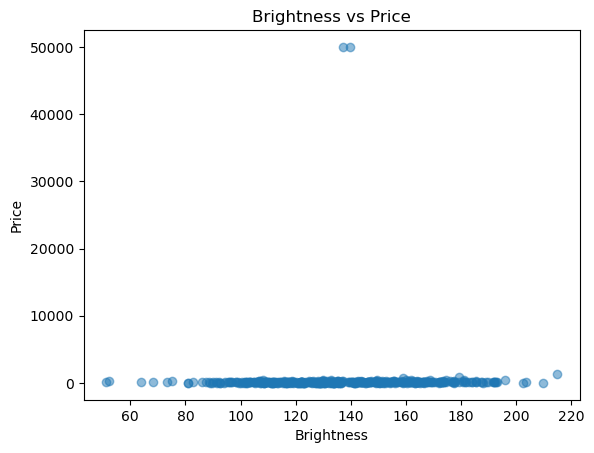

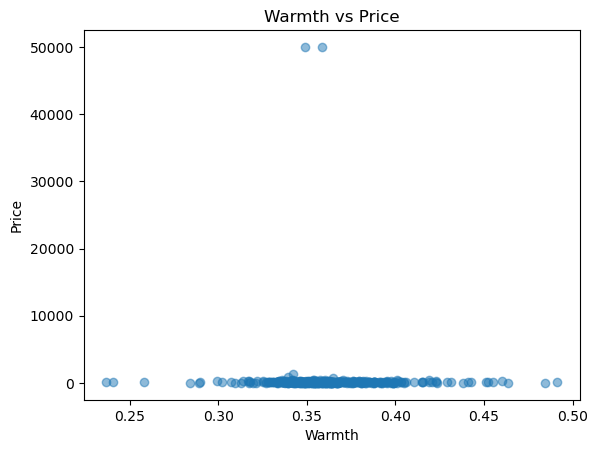

In [22]:
import matplotlib.pyplot as plt

plt.scatter(model_df["brightness"], model_df["price_num"], alpha=0.5)
plt.xlabel("Brightness")
plt.ylabel("Price")
plt.title("Brightness vs Price")
plt.show()

plt.scatter(model_df["warmth"], model_df["price_num"], alpha=0.5)
plt.xlabel("Warmth")
plt.ylabel("Price")
plt.title("Warmth vs Price")
plt.show()

In [23]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

feat_cols_interpretable = ["brightness", "warmth"]

X = model_df[feat_cols_interpretable].values
y = np.log1p(model_df["price_num"].values)   # log-price again

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

lin = LinearRegression()
lin.fit(X_train, y_train)

y_pred = lin.predict(X_test)

mae_lin = mean_absolute_error(np.expm1(y_test), np.expm1(y_pred))
r2_lin = r2_score(y_test, y_pred)

mae_lin, r2_lin, lin.coef_

(77.65776701420509, 0.02499692399098996, array([ 0.00351541, -1.12385291]))

In [37]:
!pip install transformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 45.7 MB/s  0:00:00 eta 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 566.1/566.1 kB 17.8 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.7/2.7 MB 46.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 14.6 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7/7 [transformers] [transformers]ub]


In [38]:
import torch
from transformers import CLIPProcessor, CLIPModel

clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")

clip_model.eval()

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIPModel(
  (text_model): CLIPTextTransformer(
    (embeddings): CLIPTextEmbeddings(
      (token_embedding): Embedding(49408, 512)
      (position_embedding): Embedding(77, 512)
    )
    (encoder): CLIPEncoder(
      (layers): ModuleList(
        (0-11): 12 x CLIPEncoderLayer(
          (self_attn): CLIPAttention(
            (k_proj): Linear(in_features=512, out_features=512, bias=True)
            (v_proj): Linear(in_features=512, out_features=512, bias=True)
            (q_proj): Linear(in_features=512, out_features=512, bias=True)
            (out_proj): Linear(in_features=512, out_features=512, bias=True)
          )
          (layer_norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
          (mlp): CLIPMLP(
            (activation_fn): QuickGELUActivation()
            (fc1): Linear(in_features=512, out_features=2048, bias=True)
            (fc2): Linear(in_features=2048, out_features=512, bias=True)
          )
          (layer_norm2): LayerNorm((512,), eps=1e-05,

In [39]:
import numpy as np

def clip_similarity(img, text: str) -> float:
    # Prepare inputs
    inputs = clip_processor(text=[text], images=img, return_tensors="pt", padding=True)

    with torch.no_grad():
        outputs = clip_model(**inputs)
        image_embeds = outputs.image_embeds  # (1, D)
        text_embeds = outputs.text_embeds    # (1, D)

    # Normalize
    image_embeds = image_embeds / image_embeds.norm(dim=-1, keepdim=True)
    text_embeds = text_embeds / text_embeds.norm(dim=-1, keepdim=True)

    # Cosine similarity
    sim = (image_embeds @ text_embeds.T).item()
    return float(sim)  # between -1 and 1

In [40]:
WINDOW_TEXT = "bright sunlit hotel room with a large window and natural light"

In [41]:
clip_scores = []

for i, row in model_df.iterrows():
    img_path = IMG_DIR / f"{row['id']}.jpg"
    try:
        img = Image.open(img_path).convert("RGB")
        score = clip_similarity(img, WINDOW_TEXT)
    except Exception as e:
        print(f"Skipping index {i}: {e}")
        score = np.nan

    clip_scores.append(score)

model_df["clip_natural_light"] = clip_scores
model_df[["price_num", "clip_natural_light"]].head()

,price_num,clip_natural_light
0,225.0,0.194469
1,106.0,0.253932
2,159.0,0.213876
3,86.0,0.178865
4,73.0,0.205656


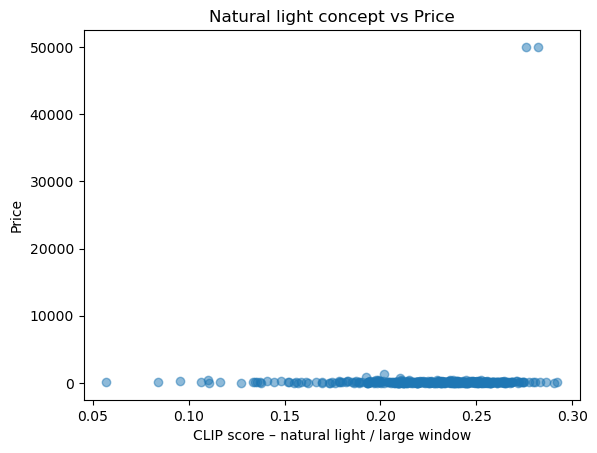

In [42]:
import matplotlib.pyplot as plt

plt.scatter(model_df["clip_natural_light"], model_df["price_num"], alpha=0.5)
plt.xlabel("CLIP score – natural light / large window")
plt.ylabel("Price")
plt.title("Natural light concept vs Price")
plt.show()

In [43]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

feat_cols_interpretable = ["brightness", "warmth", "clip_natural_light"]

X = model_df[feat_cols_interpretable].values.astype(float)
y = np.log1p(model_df["price_num"].values)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

lin3 = LinearRegression()
lin3.fit(X_train, y_train)

y_pred = lin3.predict(X_test)

mae_lin3 = mean_absolute_error(np.expm1(y_test), np.expm1(y_pred))
r2_lin3 = r2_score(y_test, y_pred)

mae_lin3, r2_lin3, lin3.coef_, feat_cols_interpretable

(77.45612528049146,
 0.009279179215759381,
 array([  0.0029022,     -1.6835,      1.7673]),
 ['brightness', 'warmth', 'clip_natural_light'])

In [44]:
MODERN_TEXT = "modern minimalist hotel room interior with clean design and stylish furniture"

In [45]:
clip_modern_scores = []

for i, row in model_df.iterrows():
    img_path = IMG_DIR / f"{row['id']}.jpg"
    try:
        img = Image.open(img_path).convert("RGB")
        score = clip_similarity(img, MODERN_TEXT)
    except Exception as e:
        print(f"Skipping index {i}: {e}")
        score = np.nan

    clip_modern_scores.append(score)

model_df["clip_modern_interior"] = clip_modern_scores
model_df[["price_num", "clip_modern_interior"]].head()

,price_num,clip_modern_interior
0,225.0,0.208374
1,106.0,0.272294
2,159.0,0.259174
3,86.0,0.238383
4,73.0,0.238887


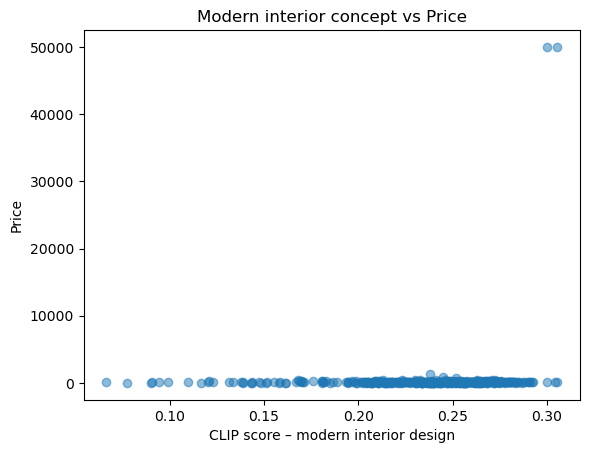

In [46]:
import matplotlib.pyplot as plt

plt.scatter(model_df["clip_modern_interior"], model_df["price_num"], alpha=0.5)
plt.xlabel("CLIP score – modern interior design")
plt.ylabel("Price")
plt.title("Modern interior concept vs Price")
plt.show()

In [47]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
import numpy as np

feat_cols_interpretable = [
    "brightness",
    "warmth",
    "clip_natural_light",
    "clip_modern_interior",
]

X = model_df[feat_cols_interpretable].values.astype(float)
y = np.log1p(model_df["price_num"].values)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

lin4 = LinearRegression()
lin4.fit(X_train, y_train)

y_pred = lin4.predict(X_test)

mae_lin4 = mean_absolute_error(np.expm1(y_test), np.expm1(y_pred))
r2_lin4 = r2_score(y_test, y_pred)

mae_lin4, r2_lin4, lin4.coef_, feat_cols_interpretable

(76.48640822531948,
 0.06504725742862083,
 array([  0.0023962,     -1.8855,     -2.0581,      3.9883]),
 ['brightness', 'warmth', 'clip_natural_light', 'clip_modern_interior'])